<a target="_blank" href="https://colab.research.google.com/github/cerr/pyCERR-Notebooks/blob/main/animate_viewer.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# Extract radiomics features from a batch of dicom datasets

The example below demonstrates extraction of radiomics features from CT scan and tumor segmentation for a batch of DICOM datasets.

#### Install pyCERR

In [4]:
%%capture
!pip install "pyCERR[napari] @ git+https://github.com/cerr/pyCERR"

#### Specify path to DICOM dataset

In [5]:
from cerr import datasets
import os
datasetsDir = os.path.dirname(datasets.__file__)
phantomDir = os.path.join(datasetsDir,'radiomics_phantom_dicom')
dicomPath = os.path.join(phantomDir, 'pat_1')

#### Define path to save animation

In [6]:
animationPath = r'/content/anim' #Outputh folder path
os.makedirs(animationPath, exist_ok=True)


#### Define animation settings

In [7]:
num_angles = 10 # Number of angles (more angles will take longer to render and generate but you can see a better animation)
name_list = [0] # Name or index of the organ/dicom structure names that you want to create animations for


#### Install Virtual Frame Buffer for Napari viewer

This step is required when a physical display is unavaiable. e.g. Google Colab. Otherwise skip to the next cell.

In [8]:
!export NAPARI_APPLICATION_IPY_INTERACTIVE=0
!export QT_DEBUG_PLUGINS=1 > /dev/null 2>&1
!apt-get update > /dev/null 2>&1
!apt-get install libqt5x11extras5-dev > /dev/null 2>&1
!apt-get install x11-utils > /dev/null 2>&1
!pip install pyglet > /dev/null 2>&1
!apt-get install -y xvfb > /dev/null 2>&1
!pip install pyvirtualdisplay > /dev/null 2>&1
from pyvirtualdisplay import Display
virtualDisplay = Display(backend="xvfb", size=(600, 600))
virtualDisplay.start()

#### Load DICOM to planC and get the list of matching structure indices from theirnames

In [10]:
from cerr import plan_container as pc

planC = pc.loadDcmDir(dicomPath)
scanNumV = [0] # list of scan indices from planC.scan
doseNumV = [] # list of dose indices from planC.dose
strNumV = []
for idx, name in enumerate(name_list):
    if isinstance(name,str):
        for i in range(len(planC.structure)):
            if planC.structure[i].structureName == name:
                print(planC.structure[i].structureName)
                strNumV.append(i) # list of structure indices from planC.structure
    else:
        strNumV.append(name) # assume index


('PAT1', 'PAT1', '1.3.6.1.4.1.9590.100.1.2.96328687310426543129572151154132284399', '1.3.6.1.4.1.9590.100.1.2.258301620411152643708006163321128526885', 'RTSTRUCT', '', '', '', '', '', '', '')
('PAT1', 'PAT1', '1.3.6.1.4.1.9590.100.1.2.96328687310426543129572151154132284399', '1.3.6.1.4.1.9590.100.1.2.296658988911737913102339329841519593982', 'CT', '', '', '', '', '', '', '')


#### Open up viewer to be able to create the animation

In [11]:
from cerr import viewer as vwr

viewer, scan_layer, struct_layer, dose_layer, dvf_layer = \
    vwr.showNapari(planC, scan_nums=scanNumV, struct_nums=strNumV, dose_nums=doseNumV, vectors_dict={}, displayMode='3d')
viewer.dims.ndisplay = 3


#### Adjust diplay settings

In [ ]:

for strLyr in  struct_layer:
    strLyr.blending = 'translucent_no_depth'
    strLyr.opacity = 0.5
#struct_layer[0].colormap = 'bop orange'
#dose_layer[0].opacity = 0.5
min_val, max_val = -500, 1500 #scan_layer[0].data.min(), scan_layer[0].data.max()
scan_layer[0].contrast_limits = (min_val, max_val)


### Generate the animation by moving the camera and then recording a keyframe

The example datasets contain only one scan and one segmentation. Hence, `scanNum = 0` and `structNum = 0` is used in this exampple. In case of multiple scans and segmentations, users should find their appropriate indices as an input to `ibsi1.computeScalarFeatures`

In [14]:
from napari_animation import Animation
import numpy as np

animation = Animation(viewer)
for angle in np.linspace(0, 360, num=num_angles):
    viewer.camera.angles = (180, angle, 0)  # Rotate around z-axis
    animation.capture_keyframe()
for angle in np.linspace(0, 360, num=num_angles):
    viewer.camera.angles = (180, 0, angle)  # Rotate around x-axis
    animation.capture_keyframe()


# Render and save the animation
animFile = os.path.join(animationPath, 'anim_tumor.gif')
animation.animate(animFile, fps=60)
viewer.close()



Rendering frames...


100%|██████████| 286/286 [03:31<00:00,  1.35it/s]


#### Render animation in notebook

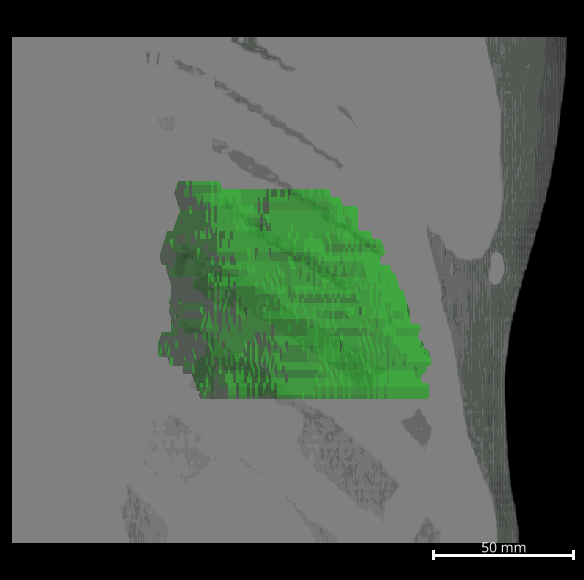

In [16]:
from IPython.display import Image

Image(open(animFile,'rb').read())